<a href="https://colab.research.google.com/github/shajibghosh/counterfeit-ic-detection-tutorial/blob/main/image_preprocessing_counterfeit_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [68]:
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/shajibghosh/counterfeit-ic-detection-tutorial/blob/main/image_preprocessing_counterfeit_detection.ipynb)

SyntaxError: ignored

# **Introduction to Image Pre-processing**

The purpose of this notebook is to introduce the learners to different `image pre-processing techniques` for preparing image data for `training deep learning algorithms or neural networks`. 

Throughout this notebook, `PyTorch` deep learning framework along with some standard data analysis and visualization libraries (e.g., `Numpy`, `PIL`, `Matplotlib`, `Pandas`) will be used. It includes a computer vision package called `torchvision` which has a simple API for image pre-processing in its `torchvision.transforms` module. The module provides users with a simple approach to create new custom transforms while also providing a collection of standard, composable image transformations.
These customized transforms may be used in the image pre-processing pipeline just like any other transforms from the module. 

You do not need to have extensive knowledge of image processing and Python programming for this tutorial, but the following resources will help.

***More on image pre-processing:*** 


1.   [Image preprocessing](https://livebook.manning.com/book/grokking-deep-learning-for-computer-vision/chapter-1/140)
2.   [Why Image Preprocessing and Augmentation Matter](https://blog.roboflow.com/why-preprocess-augment/)

***Useful introduction to [Google Colab](https://colab.research.google.com/notebooks/welcome.ipynb)***

***How to run Google Colab Notebook:*** https://www.youtube.com/watch?v=yEIc9z-Ad3k 

***More on PyTorch: [Introduction to PyTorch](https://www.youtube.com/watch?v=IC0_FRiX-sw)***

***Useful documentations on [torchvision](https://pytorch.org/vision/stable/index.html) and [torchvision.transforms](https://pytorch.org/vision/stable/transforms.html)***

# **Instructions**

*   Read the description and execute each cell. To execute a cell either press `Ctrl + Enter` or click on the `Run cell` or `play` button at the left of each cell.
*   Some cells may contain paramters/variables such as `sample_img`. You are required to change the value of those variables, get the results and report them.

* Try to answer the questions.

* Run the experiments with sample images available [here](https://github.com/shajibghosh/counterfeit-ic-detection-tutorial/tree/main/sample_data). 

# Step - 1: Collecting the data

> First, we'll collect the sample images from a `github repository` for applying the transformations and visualizing the results. 

In [ ]:
!rm -rf counterfeit-ic-detection
!git clone https://github.com/shajibghosh/counterfeit-ic-detection-tutorial.git counterfeit-ic-detection

Cloning into 'counterfeit-ic-detection'...
remote: Enumerating objects: 11, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 11 (delta 0), reused 11 (delta 0), pack-reused 0
Unpacking objects: 100% (11/11), done.


# Step - 2: Loading the dependencies
> This section loads some required libraries and modules used in this notebook: **numpy**, **pandas**, **matplotlib**, **PIL**, **torch**, **torchvision.transforms**
*   [Numpy](https://www.numpy.org/) is an array manipulation library, used for linear algebra, Fourier transform, and random number capabilities.
*   [Pandas](https://pandas.pydata.org/) is a library for data manipulation and data analysis.
*   [Matplotlib](https://matplotlib.org/) is a library which generates figures and provides graphical user interface toolkit.
*   [PIL](https://pillow.readthedocs.io/en/stable/) or *Python Imaging Library* provides extensive file format support, an efficient internal representation, and fairly powerful image processing capabilities.
*   [torch](https://) is an open-source package/library that serves as the foundation for the `PyTorch framework`. This package offers multi-dimensional tensor data structures as well as mathematical operations on these tensors.
It also includes several utilities for efficient serialization of Tensors and arbitrary types, as well as other helpful utilities. 
*   [torchvision.transforms](https://pytorch.org/vision/stable/transforms.html#transforms) module provides many important transforms that can be used to perform different types of manipulations on the image data.


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
from PIL import Image 
import torch 
import torchvision.transforms as T

# Step - 3: Reading the image data
> In this step, we will read some sample images from our dataset, and display them using `PIL`. Normal color images usually consist of 3 channels: Red, Green and Blue (R, G, B). In this tutorial, we'll deal with color images. We'll also see how to transform them to grayscale or single-channel images. 

In [ ]:
# List of sample images
sample_img_files = ['counterfeit-ic-detection/sample_data/A-D-08DIP-01B-SM.png', 'counterfeit-ic-detection/sample_data/A-D-08DIP-01F-SM.png',
                    'counterfeit-ic-detection/sample_data/A-D-64QFP-43B-D.png', 'counterfeit-ic-detection/sample_data/A-D-64QFP-43F-D.png',
                    'counterfeit-ic-detection/sample_data/C-O-08DIP-35B-D.png', 'counterfeit-ic-detection/sample_data/C-O-08DIP-35F-D.png',
                    'counterfeit-ic-detection/sample_data/C-T-64QFP-11B-SM.png', 'counterfeit-ic-detection/sample_data/C-T-64QFP-11F-SM.png']
# Loading an image data from the list of sample images into the 'sample_img' variable
img_num = 0 # This loads the first image in the list. You can change its value within 0-7 and check the results
sample_img = Image.open(sample_img_files[img_num]) 

# Step - 4: Showing sample and image information

In [ ]:
# Function for extracting sample information
def sample_info(sample_name):
  sample_name_parts = sample_name.split('-')
  print("\nSample Information: ")
  if sample_name_parts[0] == 'A':
    print("Sample label: Authentic")
  elif sample_name_parts[0] == 'C':
    print("Sample label: Counterfeit")
  if sample_name_parts[2] == '08DIP':
    print("Package type: 8-pin DIP (dual in-line package)")
  elif sample_name_parts[2] == '64QFP':
    print("Package type: 64-pin QFP (quad flat package)")
  if (sample_name_parts[3])[2] == 'B':
    print("Imaging surface: Back-side")
  elif (sample_name_parts[3])[2] == 'F':
    print("Imaging surface: Front-side")
  if sample_name_parts[4] == 'D':
    print("Imaging modality: DSLR")
  elif sample_name_parts[4] == 'SM':
    print("Imaging modality: Stereo Microscope")

# Function for extracting image information
def img_info(img_file):
  print("\nImage Information: ")
  print("Filename : ",img_file.filename)
  # Getting the format of image
  print("Format : ",img_file.format)
  # Getting the mode of image
  print("Mode : ",img_file.mode)
  # Getting the size of image
  print("Size : ",img_file.size)
  # Getting only the width of image
  print("Width : ",img_file.width)
  # Getting only the height of image
  print("Height : ",img_file.height)
  # Getting the color palette of image
  print("Image Palette : ",img_file.palette)
  # Getting the info about image
  print("Image Info : ",img_file.info)

# Extracting the sample and image information
sample_img_filename = (sample_img_files[img_num].split('/')[2])
print("Sample image file: ", sample_img_filename)
basename = sample_img_filename.split('.png')[0]
sample_info(basename)
img_info(sample_img)

Sample image file:  A-D-08DIP-01B-SM.png

Sample Information: 
Sample label: Authentic
Package type: 8-pin DIP (dual in-line package)
Imaging surface: Back-side
Imaging modality: Stereo Microscope

Image Information: 
Filename :  counterfeit-ic-detection/sample_data/A-D-08DIP-01B-SM.png
Format :  PNG
Mode :  RGB
Size :  (2560, 1920)
Width :  2560
Height :  1920
Image Palette :  None
Image Info :  {'srgb': 0, 'gamma': 0.45455, 'dpi': (300, 300)}


# Step - 5: Displaying the sample image

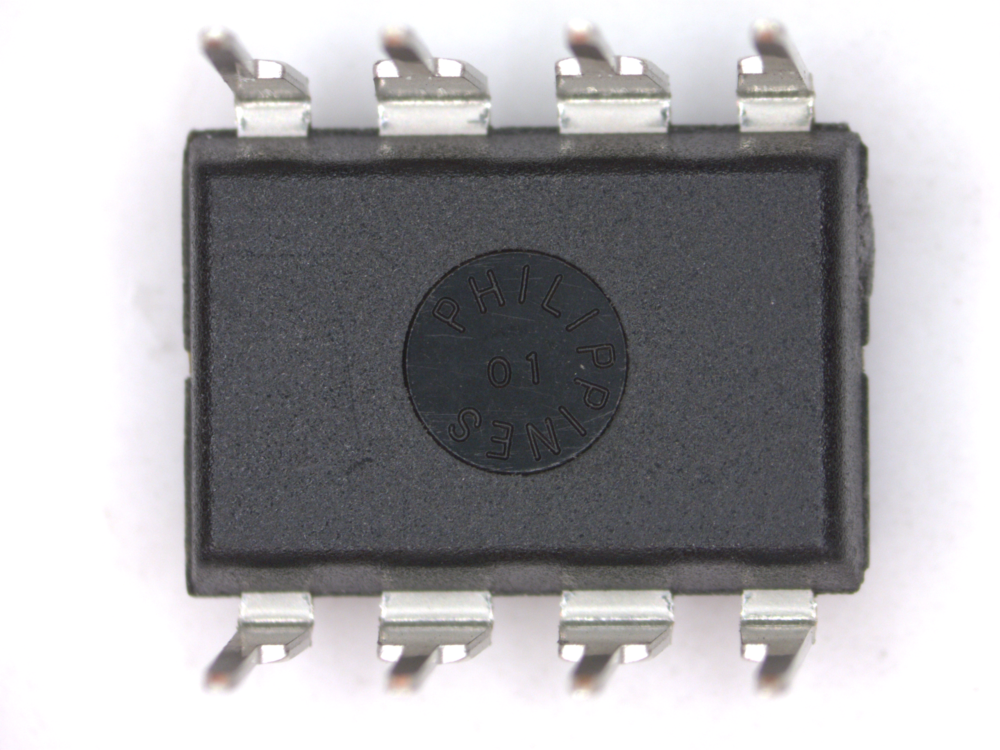

In [ ]:
sample_img

# **Why image pre-processing?**
> The collected data are typically unstructured and originate from various sources. They need to be cleaned up and standardized before being fed into the ML model (or neural network). Preprocessing is frequently utilized to carry out procedures that reduce the complexity and boost the accuracy of the given algorithm. Since there isn't a specific algorithm that can be written for every situation where an image is acquired, thus, when we acquire an image, we usually transform it into a format that a generic algorithm can use to solve it. 

# **Which image pre-processing techniques to apply and why?**
> Image preprocessing techniques might include:
>1.   Standardize/Normalize images:
>>One important constraint that exists in some machine learning algorithms, such as CNN, is the need to resize the images in the dataset to a unified/consistent dimension. This implies that the images `must be preprocessed and scaled to have identical widths and heights` before fed to the learning algorithm.
>2.   Convert color images to grayscale:
>>*   In certain problems you’ll find it useful to lose unnecessary information from your images to `reduce space or computational complexity`. 
>>*   In some applications, converting an image to grayscale may not be the best solution. `Color is critically significant` in a wide variety of contexts. 
>3.   Data augmentation: 
>>Another common pre-processing strategy is to add perturbed versions of existing images to the existing dataset. This is done to expand the dataset and expose the neural network to a wide range of image variations. This increases the likelihood that the model will recognize objects in `any form or shape`. Types of data augmentation:
>>*   Data Augmentations based on Basic Image Manipulations
>>>*   **Geometric transformations (will be covered in this notebook)**
>>>*   **Color space transformations (will be covered in this notebook)**
>>>*   Kernel filters
>>>*   Mixing images
>>>*   Random erasing
>>*   Data Augmentations based on Deep Learning
>>>*   Feature space augmentation
>>>*   Adversarial training
>>>*   GAN-based Data Augmentation
>>>*   Neural Style Transfer
>>*   Meta Learning-based Data Augmentations
>>>*   Neural augmentation
>>>*   Smart Augmentation
>>>*   AutoAugment

References: 
1.   [Image preprocessing](https://freecontent.manning.com/the-computer-vision-pipeline-part-3-image-preprocessing/)
2.   [Data augmentation techniques](https://journalofbigdata.springeropen.com/articles/10.1186/s40537-019-0197-0)


# Step - 6: Standardizing/ Normalizing Images
Data normalization is a crucial process that assures the data distribution of each input parameter (pixel in this example). This speeds up convergence while training the network. Normalization of data is accomplished by subtracting the mean from each pixel and dividing the result by the standard deviation. Such data would have a distribution resembling a Gaussian curve centered at zero.Because we need positive pixel numbers for image inputs, we may choose to scale the normalized data in the range [0,1] or [0, 255]. 

mean and std before normalize:
Mean of the image: tensor([0.6614, 0.6572, 0.6669])
Std of the image: tensor([0.3278, 0.3249, 0.3231])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


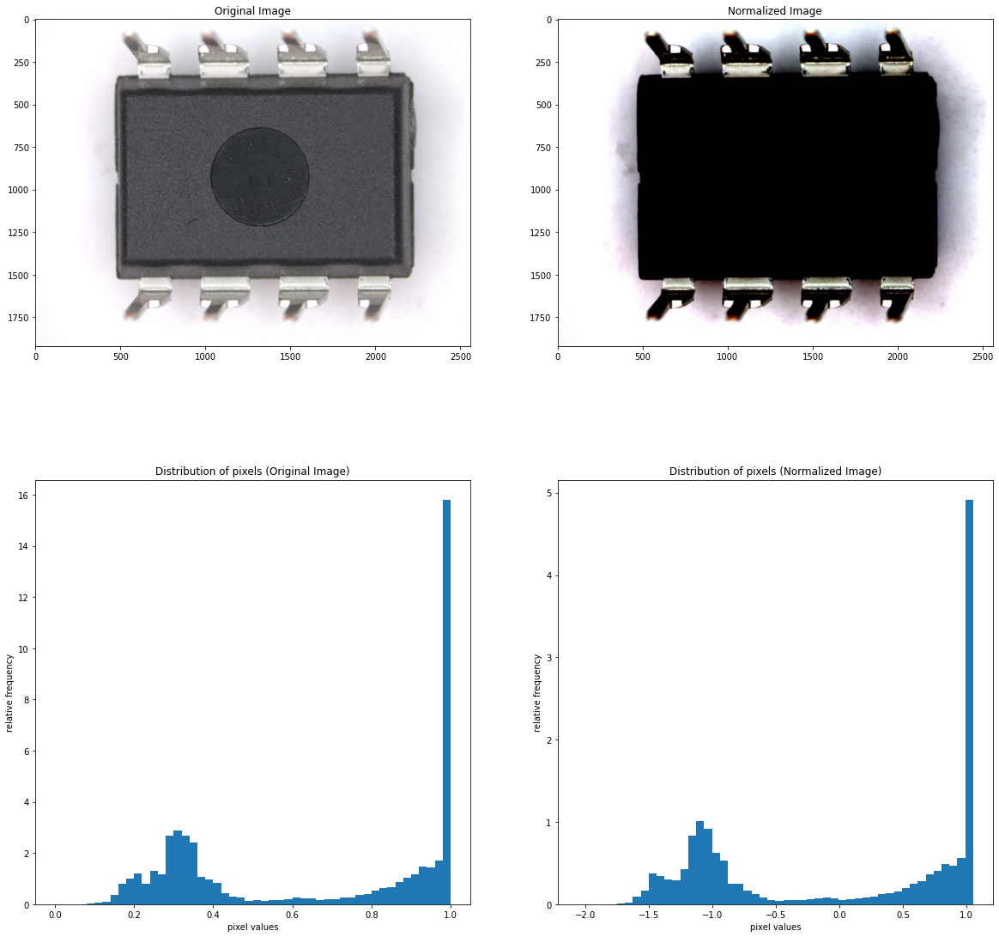

In [ ]:
def normalize(input_img):
  
  # define custom transform function
  transform = T.Compose([
    T.ToTensor()
  ])
 
  # transform the pIL image to tensor image
  img_tr = transform(input_img)
 
  # Convert tensor image to numpy array
  img_np = np.array(img_tr)
 

  # calculate mean and std
  mean, std = img_tr.mean([1,2]), img_tr.std([1,2])
 
  # print mean and std
  print("mean and std before normalize:")
  print("Mean of the image:", mean)
  print("Std of the image:", std)
  
  # define custom transform
  # here we are using our calculated mean & std
  transform_norm = T.Compose([
      T.ToTensor(),
      T.Normalize(mean, std)
  ])
  # get normalized image
  img_normalized = transform_norm(input_img)
  
  # convert normalized image to numpy array
  img_np_norm = np.array(img_normalized)
  # transpose from shape of (3,,) to shape of (,,3)
  img_normalized = img_np_norm.transpose(1, 2, 0)
 
  # plot the original and normalized images with their pixel values 
  fig = plt.figure(figsize=(20,20))
  ax = fig.add_subplot(2, 2, 1)
  imgplot = plt.imshow(input_img)
  ax.set_title('Original Image')
  ax = fig.add_subplot(2, 2, 2)
  imgplot = plt.imshow(img_normalized)
  ax.set_title('Normalized Image')
  ax = fig.add_subplot(2, 2, 3)
  imgplot = plt.hist(img_np.ravel(), bins=50, density=True)
  ax.set_title('Distribution of pixels (Original Image)')
  ax.set_xlabel('pixel values')
  ax.set_ylabel('relative frequency')
  ax = fig.add_subplot(2, 2, 4)
  imgplot = plt.hist(img_np_norm.ravel(), bins=50, density=True)
  ax.set_title('Distribution of pixels (Normalized Image)')
  ax.set_xlabel('pixel values')
  ax.set_ylabel('relative frequency')
  plt.show()

normalize(sample_img)

Using the mean and std of [ImageNet](https://ieeexplore.ieee.org/document/5206848) is a common practice. They are calculated based on millions of images. If you want to train from scratch on your own dataset, you can calculate the new mean and std (*what we'll do in our next tutorial notebook during training our algorithm*). Otherwise, using the ImageNet pretrained model with its own mean and std is recommended (*we'll also compare the performance with the pretrained model using the ImageNet mean and std values for normalization*). 
As for this tutorial notebook, we don't have the full dataset, we'll explore how using the mean and std of ImageNet dataset for normalizing the sample image works. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


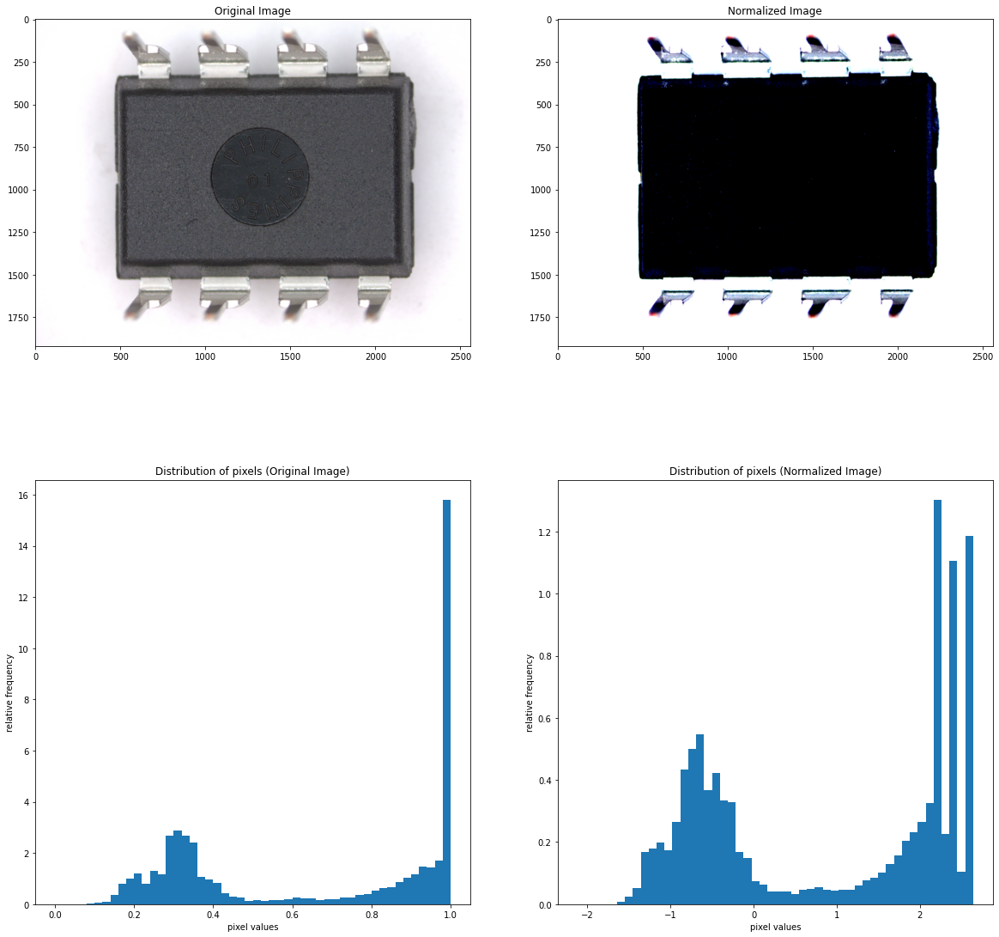

In [ ]:
# Normalizing image with mean and std of ImageNet dataset
normalize_transform = T.Compose([
      T.ToTensor(),
      T.Normalize(mean=[0.485, 0.456, 0.406], 
                  std=[0.229, 0.224, 0.225])
  ])
# define custom transform function
transform = T.Compose([
    T.ToTensor()
])
 
# transform the pIL image to tensor image
img_tran = transform(sample_img)
 
# Convert tensor image to numpy array
img_arr = np.array(img_tran)

# get normalized image
img_norm = normalize_transform(sample_img)
  
# convert normalized image to numpy array
img_norm_arr = np.array(img_norm)
# transpose from shape of (3,,) to shape of (,,3)
img_norm = img_norm_arr.transpose(1, 2, 0)
 
# plot the original and normalized images with their pixel values 
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(2, 2, 1)
imgplot = plt.imshow(sample_img)
ax.set_title('Original Image')
ax = fig.add_subplot(2, 2, 2)
imgplot = plt.imshow(img_norm)
ax.set_title('Normalized Image')
ax = fig.add_subplot(2, 2, 3)
imgplot = plt.hist(img_arr.ravel(), bins=50, density=True)
ax.set_title('Distribution of pixels (Original Image)')
ax.set_xlabel('pixel values')
ax.set_ylabel('relative frequency')
ax = fig.add_subplot(2, 2, 4)
imgplot = plt.hist(img_norm_arr.ravel(), bins=50, density=True)
ax.set_title('Distribution of pixels (Normalized Image)')
ax.set_xlabel('pixel values')
ax.set_ylabel('relative frequency')
plt.show()

> **Try yourself:**
>*   Do you find any differences between the two normalization approaches? What are those differences? 
>*   Why and when normalizing is important?
>*   Is there any difference between normalization and standardization? If yes, then, which one is appropriate for the classification problem? 
[Hints: [Nomalization and Standardization](https://www.geeksforgeeks.org/normalization-vs-standardization/) ]





# Step - 7: Converting Color Images to Grayscale Images

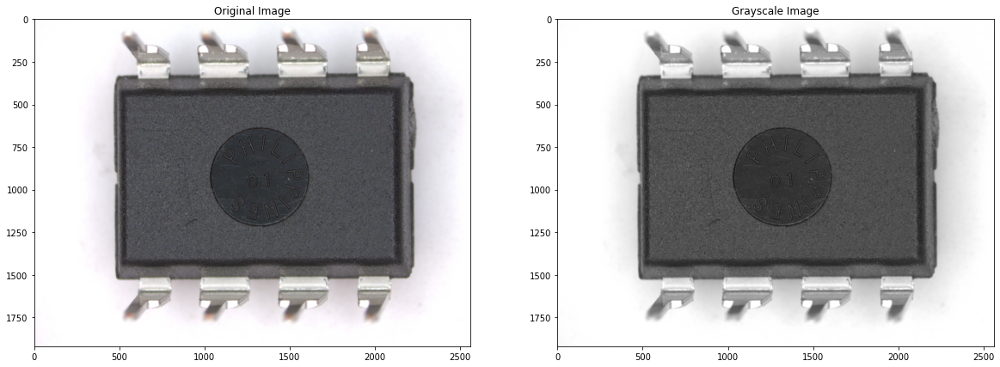

In [ ]:
grayscale_img = sample_img.convert('LA')  
#grayscale_img = sample_img.convert('L')
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(1, 2, 1)
imgplot = plt.imshow(sample_img)
ax.set_title('Original Image')
ax = fig.add_subplot(1, 2, 2)
imgplot = plt.imshow(grayscale_img)
ax.set_title('Grayscale Image')
plt.show()

> **Try yourself:**
>   
Uncomment the following line in the previous cell:
    #grayscale_img = sample_img.convert('L')
>Then, comment the first line in the previous cell:

    grayscale_img = sample_img.convert('LA')

> What differences you can see? Why are you are seeing the differences? 

> [Hints: [Convert Image to Grayscale in Python](https://www.delftstack.com/howto/python/convert-image-to-grayscale-python/)]



# Step - 8: Data Augmentations based on Basic Image Manipulations


**Geometric Transformations**

> **Resizing**

Height and width of the original image:
Height:  1920
Width:  2560

Height and width of the resized image:
Height:  480
Width:  640


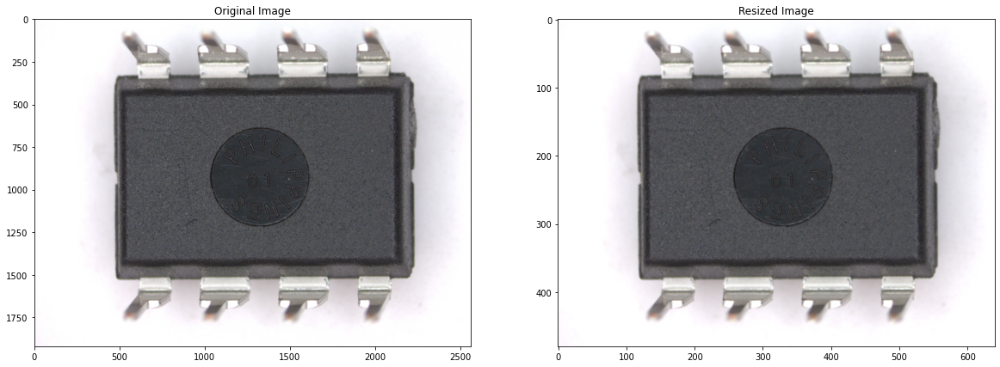

In [ ]:
# transform for resizing
factor_height = 4  # You can change the value of 'factor_height' and observe the results.
factor_width = 4  # You can change the value of 'factor_width' and observe the results. 
height = int(sample_img.size[1]/factor_height)
width = int(sample_img.size[0]/factor_width)
resize_transform = T.Resize((height,width))

resized_img = resize_transform(sample_img)
print("Height and width of the original image:")
print("Height: ", sample_img.size[1])
print("Width: ", sample_img.size[0])

print("\nHeight and width of the resized image:")
print("Height: ", height)
print("Width: ", width)

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(1, 2, 1)
imgplot = plt.imshow(sample_img)
ax.set_title('Original Image')
ax = fig.add_subplot(1, 2, 2)
imgplot = plt.imshow(resized_img)
ax.set_title('Resized Image')

plt.show()

> **Flipping (Vertical and Horizontal Flip)**

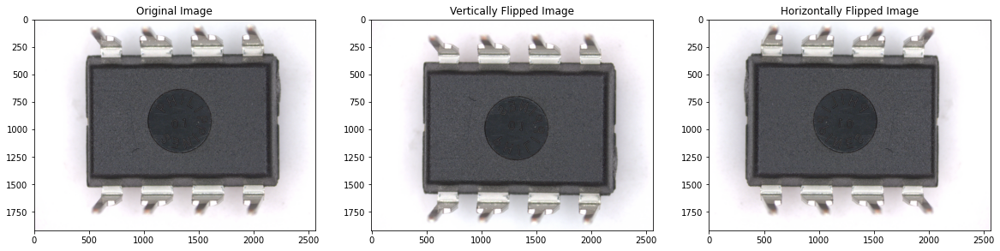

In [ ]:
# You can change the value of 'p' within 0 to 1 and observe the results. 
# Here, 'p' is the probability of the operation. 

vflip_transform = T.RandomVerticalFlip(p=1)   
hflip_transform = T.RandomHorizontalFlip(p=1)  

img_vflipped = vflip_transform(sample_img)
img_hflipped = hflip_transform(sample_img)

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(1, 3, 1)
imgplot = plt.imshow(sample_img)
ax.set_title('Original Image')
ax = fig.add_subplot(1, 3, 2)
imgplot = plt.imshow(img_vflipped)
ax.set_title('Vertically Flipped Image')
ax = fig.add_subplot(1, 3, 3)
imgplot = plt.imshow(img_hflipped)
ax.set_title('Horizontally Flipped Image')
plt.show()

> **Try yourself:**
>*   Can you spot the differences? If yes, include them in your report.  

> **Cropping**

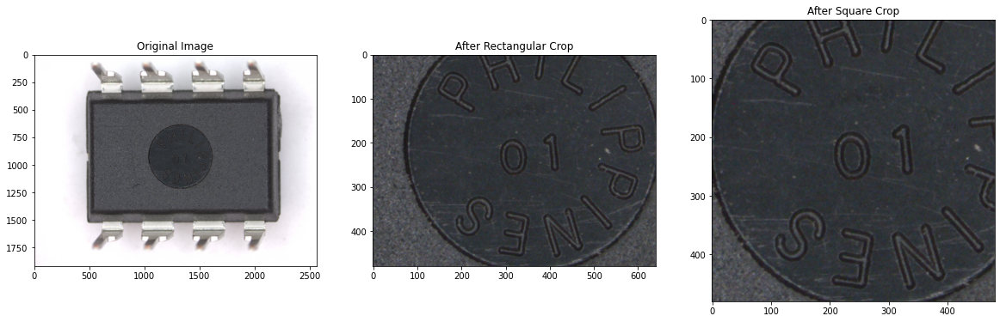

In [ ]:
# transform for rectangular crop
factor = 4  # You can change the value of 'factor' and observe the results. 
height = int(sample_img.size[1]/factor)
width = int(sample_img.size[0]/factor)
crop_rect_transform = T.CenterCrop((height,width))

# transform for square crop
dimension = height # You can change the value of 'dimension' and observe the results.
crop_sqr_transform = T.CenterCrop(dimension) 

rect_cropped = crop_rect_transform (sample_img)
sqr_cropped = crop_sqr_transform (sample_img)

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(1, 3, 1)
imgplot = plt.imshow(sample_img)
ax.set_title('Original Image')
ax = fig.add_subplot(1, 3, 2)
imgplot = plt.imshow(rect_cropped)
ax.set_title('After Rectangular Crop')
ax = fig.add_subplot(1, 3, 3)
imgplot = plt.imshow(sqr_cropped)
ax.set_title('After Square Crop')
plt.show()

> **Rotation**

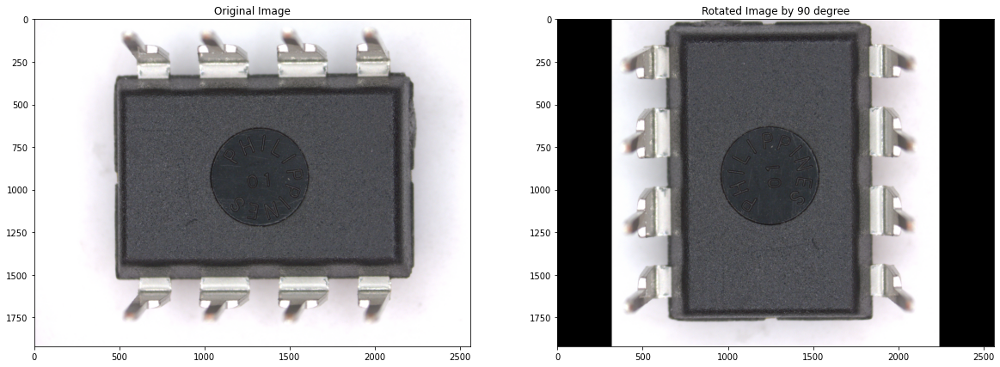

In [ ]:
# define the angle of rotation 
angle = 90  # You can change the value of 'angle' and observe the results.

# define a transform to rotate the image
rotated_img = T.functional.rotate(sample_img,angle)


fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(1, 2, 1)
imgplot = plt.imshow(sample_img)
ax.set_title('Original Image')
ax = fig.add_subplot(1, 2, 2)
imgplot = plt.imshow(rotated_img)
ax.set_title('Rotated Image by {} degree'.format(angle))

plt.show()

> **Noise Injection**

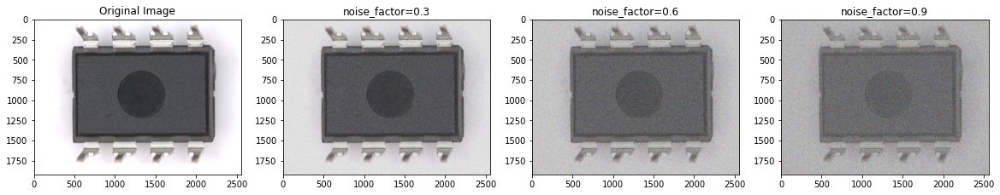

In [ ]:
# Function for adding noise 
def add_noise(inputs,noise_factor):
     noisy = inputs+torch.randn_like(inputs) * noise_factor
     noisy = torch.clip(noisy,0.,1.)
     return noisy

# Function for visualizing the impact of adding noise
def plot(imgs, cols):
  fig = plt.figure(figsize=(20,20))
  for i in range(len(imgs)):
      ax = fig.add_subplot(1,len(imgs), i+1)
      imgplot = plt.imshow(imgs[i])
      ax.set_title(cols[i])

# You can change the 'noise_factor' values from 0 to 1. 
# Don't change the first value (noise_factor = 0.0), as it represents the original sample image. 
noise_imgs = [add_noise(T.ToTensor()(sample_img),noise_factor) for noise_factor in (0.0,0.3,0.6,0.9)]
noise_imgs = [T.ToPILImage()(noise_img) for noise_img in noise_imgs]
col_title=["Original Image", "noise_factor=0.3","noise_factor=0.6","noise_factor=0.9"]
plot(noise_imgs, col_title)

**Color Space Transformations**



>**Color Jitter**
>*  Adjusts `brightness`, `hue`, `contrast`, and `saturation` of the input image according to the defined factors. 

>More on Color Jitter: [ColorJitter](https://pytorch.org/vision/main/generated/torchvision.transforms.ColorJitter.html#torchvision.transforms.ColorJitter)




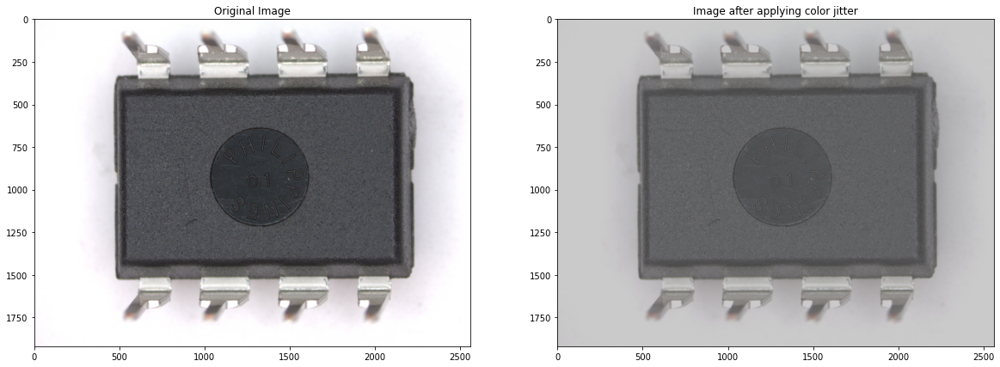

In [ ]:
# You can change the value of the following factors and observe the changes

# You can set value to only one factor and keep other factors as '0.0'
# To only apply single transformation

brightness_factor = 0.3
hue_factor = 0.2
contrast_factor = 0.4
saturation_factor = 0.5

color_jitter_transform = T.ColorJitter(brightness=brightness_factor, contrast=contrast_factor, 
                                       saturation=saturation_factor, hue=hue_factor)

color_jitter_img = color_jitter_transform(sample_img)

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(1, 2, 1)
imgplot = plt.imshow(sample_img)
ax.set_title('Original Image')
ax = fig.add_subplot(1, 2, 2)
imgplot = plt.imshow(color_jitter_img)
ax.set_title('Image after applying color jitter')
plt.show()

>**Gamma Correction**

>One of the strategies for `creating enhanced images` is `gamma correction`. In general, gamma correction uses a nonlinear function to adjust the brightness of an image to match human eyesight. When a camera captures a natural image, it is shown on a monitor with gamma correction that is appropriate for human vision. Each pixel intensity is changed according to gamma value. If gamma is `bigger than 1`, the `intensity decreases`. If gamma is `smaller than 1`, the `intensity increases`. 

> Reference: 
*   [Understanding Gamma Correction](https://www.cambridgeincolour.com/tutorials/gamma-correction.htm)
*   [GammaFAQ](http://poynton.ca/PDFs/GammaFAQ.pdf)



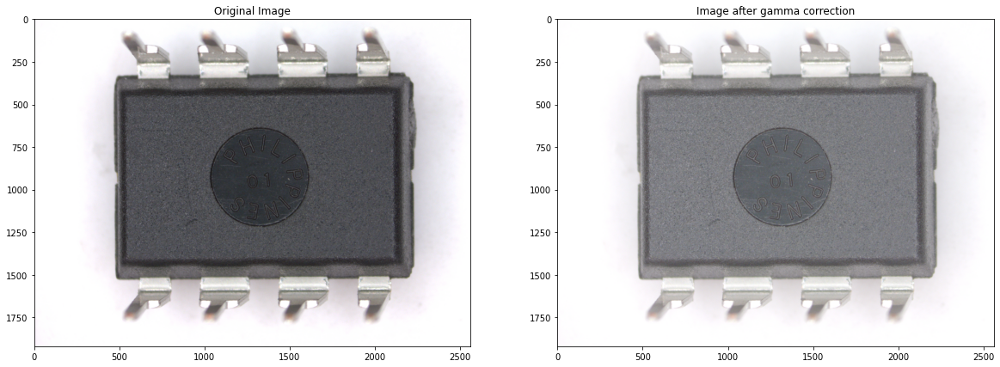

In [ ]:
# You can change the value of 'gamma_factor' to see the changes
gamma_factor = 0.6
gamma_corrected_img = T.functional.adjust_gamma(sample_img, gamma = gamma_factor)

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(1, 2, 1)
imgplot = plt.imshow(sample_img)
ax.set_title('Original Image')
ax = fig.add_subplot(1, 2, 2)
imgplot = plt.imshow(gamma_corrected_img)
ax.set_title('Image after gamma correction')
plt.show()

>**Histogram Equalization**

> `Histogram` is a graphical depiction of an image's `intensity distribution`.Simply put, it reflects `the number of pixels examined for each intensity value`.

> `Histogram Equalization` is a technique for adjusting the contrast of an image by utilizing its histogram. It spreads out the most common pixel intensity values or widens the intensity range of the image to improve contrast.By achieving this, histogram equalization `enables the image's low-contrast regions to obtain higher contrast`. 

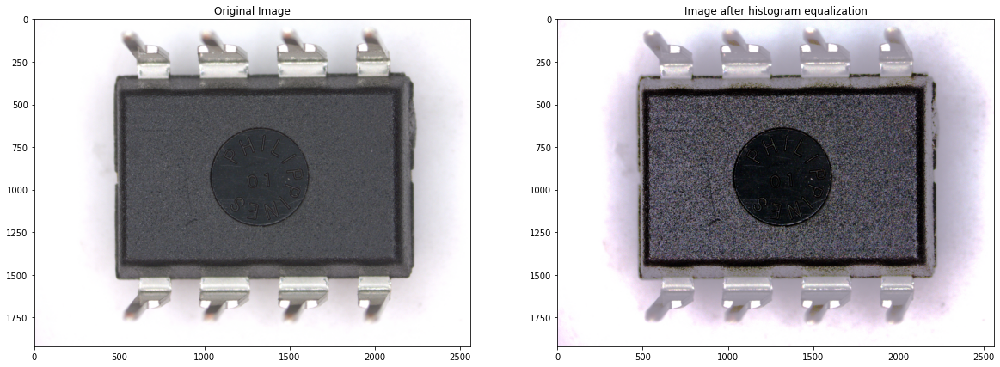

In [ ]:
hist_equalized_img = T.functional.equalize(sample_img)

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(1, 2, 1)
imgplot = plt.imshow(sample_img)
ax.set_title('Original Image')
ax = fig.add_subplot(1, 2, 2)
imgplot = plt.imshow(hist_equalized_img)
ax.set_title('Image after histogram equalization')
plt.show()

# **Final Notes:**
*   Image pre-processing is an important step for developing efficient machine learning algorithms
*   There are wide range of transformations. You have to find out the appropriate set of transformations for your application (e.g., object detection, classification, segmentation etc.). This depends on - 
>*   Data distribution and charactersitics
>*   Characteristics of the Convolutional Neural Network (CNN)
>*   The domain-specific application (i.e., tumor detection in medical domain or counterfeit IC detection in hardware assurance domain)

*   After performing the image pre-processing step before feature extraction and feature selection (either using basic ML algorithm or CNNs), you should be able to answer the following questions:
>*   Do these data make sense?
>*   Do these data adhere to the field's specific rules?
>*   Does this pre-processing substantiate or refute the model feature?
>*   Do these transformations help to identify patterns in the data?

Reference: [A review: Data pre-processing and data augmentation techniques](https://www.sciencedirect.com/science/article/pii/S2666285X22000565)



